# Exercise 2: Wind speed

## Clean data

In [15]:
import pandas as pd
df_wind = pd.read_csv('../data/data_wind.csv')

In [16]:
df_wind.head()

,HORA (UTC),"VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))","VENTO, VELOCIDADE HORARIA (m/s)",UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C),TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C),"UMIDADE RELATIVA DO AR, HORARIA (%)","PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)","PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)","VENTO, RAJADA MAXIMA (m/s)",PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)
0,12:00,0.809017,1.8,69.0,60.0,22.6,20.7,61.0,888.2,0.0,3.8,888.2,887.7
1,13:00,0.965926,2.7,62.0,55.0,24.2,22.5,55.0,888.4,0.0,4.7,888.4,888.2
2,14:00,0.891007,2.0,56.0,50.0,25.5,24.3,51.0,888.1,0.0,4.9,888.4,888.1
3,15:00,0.848048,2.5,52.0,44.0,27.4,25.0,44.0,887.4,0.0,5.8,888.1,887.4
4,16:00,0.224951,2.4,50.0,43.0,27.1,25.5,46.0,886.5,0.0,5.8,887.4,886.5


In [17]:
df_wind.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87693 entries, 0 to 87692
Data columns (total 13 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   HORA (UTC)                                             87693 non-null  object 
 1   VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))             87693 non-null  float64
 2   VENTO, VELOCIDADE HORARIA (m/s)                        87693 non-null  float64
 3   UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)               87693 non-null  float64
 4   UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)               87693 non-null  float64
 5   TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C)         87693 non-null  float64
 6   TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C)         87693 non-null  float64
 7   UMIDADE RELATIVA DO AR, HORARIA (%)                    87693 non-null  float64
 8   PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORAR

In [18]:
df_wind.isnull().sum().sum()

0

We don't have missing values.

In [19]:
df_wind.columns

Index(['HORA (UTC)', 'VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))',
       'VENTO, VELOCIDADE HORARIA (m/s)',
       'UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)',
       'UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)',
       'TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C)',
       'TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C)',
       'UMIDADE RELATIVA DO AR, HORARIA (%)',
       'PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)',
       'PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)', 'VENTO, RAJADA MAXIMA (m/s)',
       'PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB)',
       'PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)'],
      dtype='object')

We don't have significative column names so we can rename them.

In [20]:
new_columns = [
    'Hour',
    'Wind direction (gr)',
    'Wind speed (m/s)',
    'Relative humidity max (%)',
    'Relative humidity min (%)',
    'Temperature min (℃)',
    'Temperature max (℃)',
    'Relative humidity (%)',
    'Atmospheric pressure at station level (mB)',
    'Precipitation (mm)',
    'Wind gust max (m/s)',
    'Atmospheric pressure max (mB)',
    'Atmospheric pressure min (mB)'
]

df_wind.rename(columns=dict(zip(df_wind.columns, new_columns)), inplace=True)
df_wind.columns

Index(['Hour', 'Wind direction (gr)', 'Wind speed (m/s)',
       'Relative humidity max (%)', 'Relative humidity min (%)',
       'Temperature min (℃)', 'Temperature max (℃)', 'Relative humidity (%)',
       'Atmospheric pressure at station level (mB)', 'Precipitation (mm)',
       'Wind gust max (m/s)', 'Atmospheric pressure max (mB)',
       'Atmospheric pressure min (mB)'],
      dtype='object')

Some hours are missing, for instance sometimes we have the hour 17 and 19 without having 18. We are going to add these hours with values. Later we will try to impute theses values.

In [21]:
total_added = 0

for _ in range(23):
    hours = df_wind['Hour']
    idx = 0
    nb_added = 0

    while idx < len(hours) - 1:
        cur_hour = int(hours[idx].split(':')[0])
        next_hour = int(hours[idx + 1].split(':')[0])
        if next_hour != (cur_hour + 1) % 24:
            if (cur_hour + 1) % 24 < 10:
                new_str = "0"+str((cur_hour + 1) % 24)+":00"
            else:
                new_str = str((cur_hour + 1) % 24)+":00"
            new_row = pd.DataFrame({'Hour': [new_str]})
            df_wind = pd.concat([df_wind.iloc[:idx + nb_added + 1], new_row, df_wind.iloc[idx + nb_added + 1:]], ignore_index=True)
            nb_added += 1
        idx += 1
    print(f"Added {nb_added} rows")
    total_added += nb_added

print(f"Total: added {total_added}")

Added 866 rows
Added 332 rows
Added 241 rows
Added 182 rows
Added 141 rows
Added 122 rows
Added 106 rows
Added 92 rows
Added 79 rows
Added 67 rows
Added 57 rows
Added 52 rows
Added 44 rows
Added 41 rows
Added 37 rows
Added 31 rows
Added 27 rows
Added 23 rows
Added 16 rows
Added 11 rows
Added 8 rows
Added 5 rows
Added 3 rows
Total: added 2583


The hour is given as a string. Considered we have data for almost ten years, we can change the format of the hour, starting with a given year, for instance the year 2000.

In [22]:
import datetime as dt

start_date = dt.datetime(2000, 1, 1, int(df_wind['Hour'][0][:2]))

df_wind['Date'] = [start_date + dt.timedelta(hours=i) for i in range(len(df_wind['Hour']))]

The data are not in the units of the international system. We can change that.

In [23]:
df_wind['Hour'] = df_wind['Hour'].apply(lambda x: int(x.split(':')[0]))

df_wind['Relative humidity max'] = df_wind['Relative humidity max (%)'].apply(lambda x: x/100)
df_wind.drop(columns=['Relative humidity max (%)'], inplace=True)

df_wind['Relative humidity min'] = df_wind['Relative humidity min (%)'].apply(lambda x: x/100)
df_wind.drop(columns=['Relative humidity min (%)'], inplace=True)

df_wind['Temperature max (K)'] = df_wind['Temperature max (℃)'].apply(lambda x: x+273.15)
df_wind.drop(columns=['Temperature max (℃)'], inplace=True)

df_wind['Temperature min (K)'] = df_wind['Temperature min (℃)'].apply(lambda x: x+273.15)
df_wind.drop(columns=['Temperature min (℃)'], inplace=True)

df_wind['Relative humidity'] = df_wind['Relative humidity (%)'].apply(lambda x: x/100)
df_wind.drop(columns=['Relative humidity (%)'], inplace=True)

df_wind['Atmospheric pressure at station level (Pa)'] = df_wind['Atmospheric pressure at station level (mB)'].apply(lambda x: x*100)
df_wind.drop(columns=['Atmospheric pressure at station level (mB)'], inplace=True)

df_wind['Precipitation (m)'] = df_wind['Precipitation (mm)'].apply(lambda x: x/1000)
df_wind.drop(columns=['Precipitation (mm)'], inplace=True)

df_wind['Atmospheric pressure max (Pa)'] = df_wind['Atmospheric pressure max (mB)'].apply(lambda x: x*100)
df_wind.drop(columns=['Atmospheric pressure max (mB)'], inplace=True)

df_wind['Atmospheric pressure min (Pa)'] = df_wind['Atmospheric pressure min (mB)'].apply(lambda x: x*100)
df_wind.drop(columns=['Atmospheric pressure min (mB)'], inplace=True)

df_wind.columns.sort_values()

Index(['Atmospheric pressure at station level (Pa)',
       'Atmospheric pressure max (Pa)', 'Atmospheric pressure min (Pa)',
       'Date', 'Hour', 'Precipitation (m)', 'Relative humidity',
       'Relative humidity max', 'Relative humidity min', 'Temperature max (K)',
       'Temperature min (K)', 'Wind direction (gr)', 'Wind gust max (m/s)',
       'Wind speed (m/s)'],
      dtype='object')

In [24]:
df_wind.head()

,Hour,Wind direction (gr),Wind speed (m/s),Wind gust max (m/s),Date,Relative humidity max,Relative humidity min,Temperature max (K),Temperature min (K),Relative humidity,Atmospheric pressure at station level (Pa),Precipitation (m),Atmospheric pressure max (Pa),Atmospheric pressure min (Pa)
0,12,0.809017,1.8,3.8,2000-01-01 12:00:00,0.69,0.60,293.85,295.75,0.61,88820.0,0.0,88820.0,88770.0
1,13,0.965926,2.7,4.7,2000-01-01 13:00:00,0.62,0.55,295.65,297.35,0.55,88840.0,0.0,88840.0,88820.0
2,14,0.891007,2.0,4.9,2000-01-01 14:00:00,0.56,0.50,297.45,298.65,0.51,88810.0,0.0,88840.0,88810.0
3,15,0.848048,2.5,5.8,2000-01-01 15:00:00,0.52,0.44,298.15,300.55,0.44,88740.0,0.0,88810.0,88740.0
4,16,0.224951,2.4,5.8,2000-01-01 16:00:00,0.50,0.43,298.65,300.25,0.46,88650.0,0.0,88740.0,88650.0


In [25]:
df_wind.to_csv('../data/data_wind_eda.csv', index=False)

## EDA

In [26]:
import pandas as pd

data_wind = pd.read_csv("../data/data_wind_eda.csv")

In [27]:
data_eda = data_wind.drop(columns=['Hour', 'Date'])
data_eda.shape

(90276, 12)

In [28]:
missing_data_count = data_wind.isnull().sum()
missing_data_percentage = round((missing_data_count / len(data_wind)) * 100, 1)

missing_data_stats = pd.DataFrame({
    'Missing data (count)': missing_data_count,
    'Missing data (%)': missing_data_percentage
})

missing_data_stats

,Missing data (count),Missing data (%)
Hour,0,0.0
Wind direction (gr),2583,2.9
Wind speed (m/s),2583,2.9
Wind gust max (m/s),2583,2.9
Date,0,0.0
Relative humidity max,2583,2.9
Relative humidity min,2583,2.9
Temperature max (K),2583,2.9
Temperature min (K),2583,2.9
Relative humidity,2583,2.9


By adding missing hours, we have now around 3% of missing values.

In [29]:
data_eda.describe()

,Wind direction (gr),Wind speed (m/s),Wind gust max (m/s),Relative humidity max,Relative humidity min,Temperature max (K),Temperature min (K),Relative humidity,Atmospheric pressure at station level (Pa),Precipitation (m),Atmospheric pressure max (Pa),Atmospheric pressure min (Pa)
count,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000
mean,0.405810,2.466192,5.161076,0.690585,0.631762,293.834570,295.071264,0.661467,88725.192547,0.000161,88758.072366,88689.109279
std,0.686247,1.313968,2.311157,0.196402,0.201663,3.513744,3.721386,0.199923,401.240375,0.001308,364.675005,356.453928
min,-1.000000,0.000000,0.000000,0.120000,0.100000,281.550000,282.350000,0.100000,86340.000000,0.000000,86530.000000,86280.000000
25%,-0.156434,1.500000,3.400000,0.540000,0.480000,291.550000,292.350000,0.510000,88530.000000,0.000000,88560.000000,88500.000000
50%,0.788011,2.400000,5.000000,0.720000,0.640000,293.350000,294.550000,0.680000,88720.000000,0.000000,88750.000000,88690.000000
75%,0.970296,3.400000,6.800000,0.870000,0.800000,296.250000,297.850000,0.840000,88910.000000,0.000000,88930.000000,88880.000000
max,1.000000,10.000000,24.300000,1.000000,0.980000,307.550000,308.450000,0.990000,102350.000000,0.070800,91310.000000,91090.000000


In [39]:
import plotly.graph_objects as go

col = data_eda.columns[0]
fig = go.Figure()
fig.add_trace(go.Scatter(x=data_wind['Date'], y=data_wind[col], mode='lines', name=col))
fig.update_layout(title=f'{col} over time',
                  xaxis_title='Date', 
                  yaxis_title=col,
                  margin=dict(l=20, r=20, t=40, b=20))
fig

In [40]:
import plotly.graph_objects as go

col = data_eda.columns[1]
fig = go.Figure()
fig.add_trace(go.Scatter(x=data_wind['Date'], y=data_wind[col], mode='lines', name=col))
fig.update_layout(title=f'{col} over time',
                  xaxis_title='Date', 
                  yaxis_title=col,
                  margin=dict(l=20, r=20, t=40, b=20))
fig

- We can see that the wind direction change a lot and very fast which make hard to predict this field.  
- We can see cycles during the year in the humidity (min, max and relative) and cycles during the day for temperatures but not cycles during the year so we can assume a special climate.  
- We can see outliers for the atmosferical pressure. Because of the type of validation, we are going to keep them because it doesn't influence all validations, only a few ones.  
- We can notice a very high variability for some values so we can imagine a change of sensor in some periods.
- We can see cycles for the atmosferical pressure during the days and during the years.

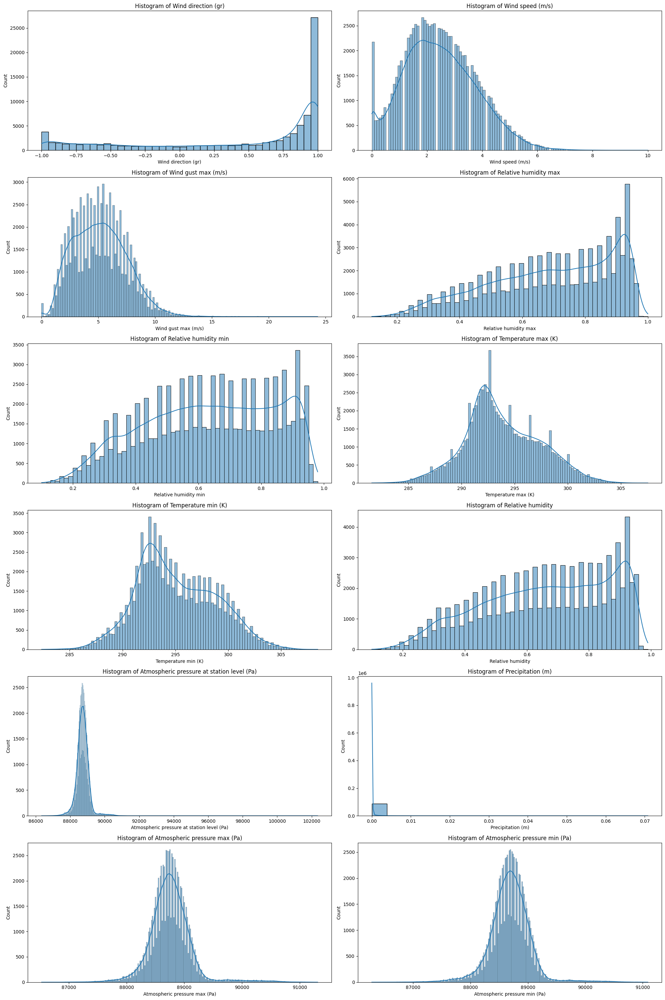

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(6, 2, figsize=(20, 30))
axes = axes.flatten()

for i, var in enumerate(data_eda.columns):
    sns.histplot(data=data_eda, x=var, kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {var}')
    
plt.tight_layout()
plt.show()

The histogram reveals a non-uniform distribution, we cannot perform a normality test because of the high probable sensor change that influences a lot the repartition. However, by looking at the histograms, we can assume a normal distribution for the pressure and maybe for the wind speed.

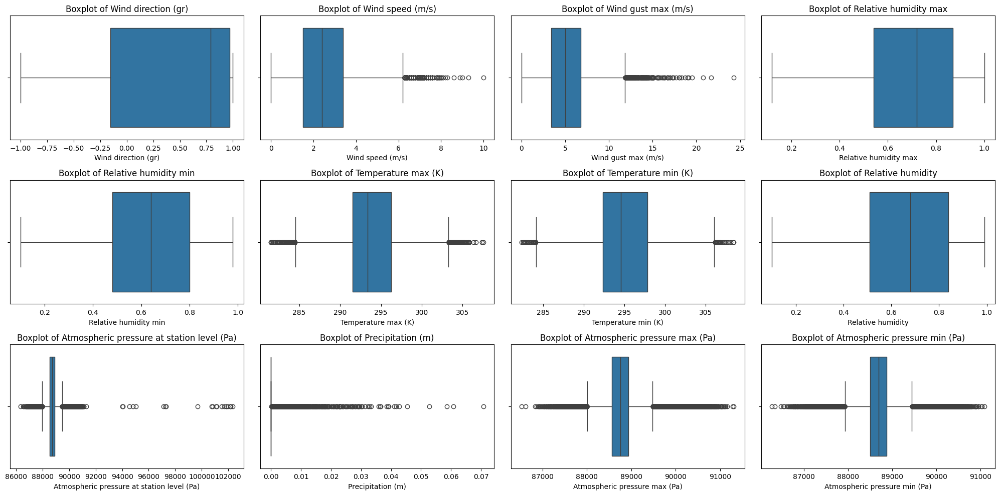

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(3, 4, figsize=(20, 10))
axes = axes.flatten()

for i, var in enumerate(data_eda.columns):
    sns.boxplot(x=data_eda[var], ax=axes[i])
    axes[i].set_xlabel(var)
    axes[i].set_title(f'Boxplot of {var}')

plt.tight_layout()
plt.show()

We can see a lot of outliers.  
For the total precipitation, the high majority of values are concentrated around 0 which means we have a lot of hours without rain.

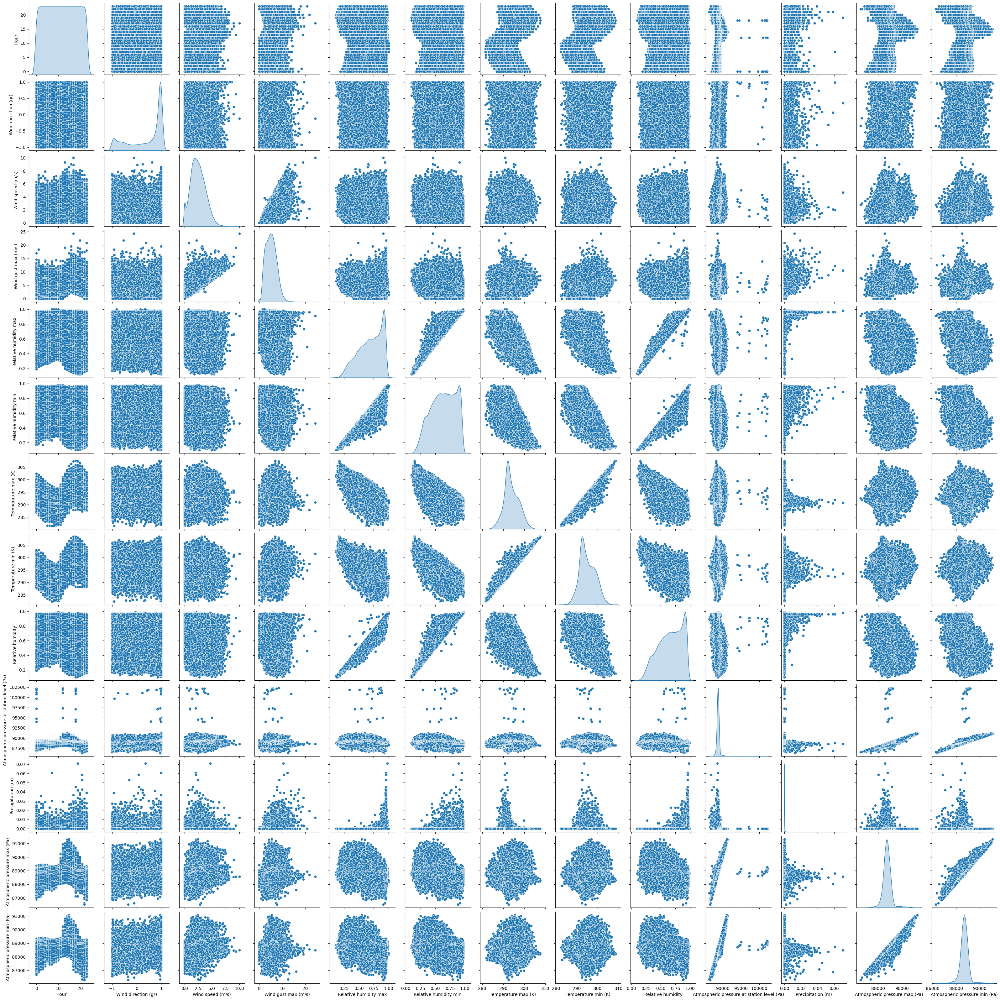

In [33]:
import seaborn as sns

sns.pairplot(data_wind, diag_kind='kde')

We can observe a linear correlation between some features like the pressure min, max and at station level. Even if it's not exact, we can also notice a correlation between humidity and temperature. This pairplot underlines the extreme values, for exemple the pairplot between atmospheric pressure max and at station level.

We can also notice a correlation between the wind gusts and our output wind speed.

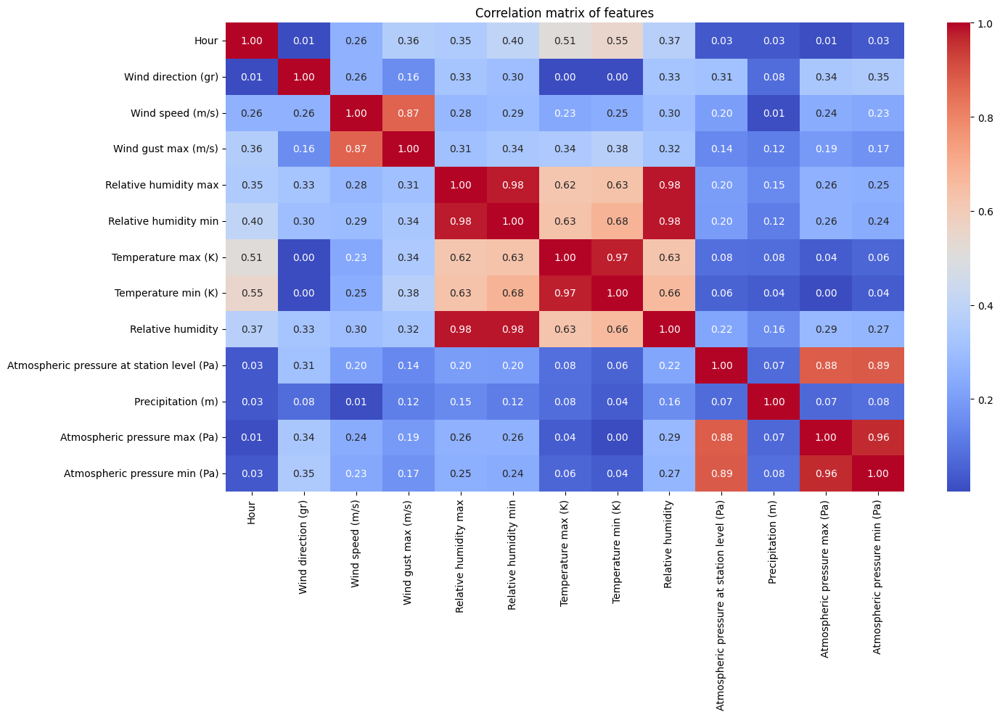

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(15, 10))

corr_matrix = data_wind.drop(columns=['Date']).corr().abs()

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=ax)

ax.set_title('Correlation matrix of features')

plt.tight_layout()
plt.show()


We can confirm the very high correlation between some features like the atmospheric pressure min, max and at station level. Same for humidity min and max. Maybe it can help the training to reduce the multicolinearity.